In [1]:
import torch
import torchvision
from torchvision import models
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import math
import os
import time
from torch.distributions import Normal

device = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")

# Loading data sets

In [2]:
n_bits = 4

In [3]:
#CIFAR10
cifar_transform = transforms.Compose([
     transforms.Lambda(lambda im: np.array(im, dtype=np.float32)),
     transforms.Lambda(lambda x: np.floor(x / 2**(8 - n_bits)) / 2**n_bits), #bit reduction
     transforms.ToTensor(),
     transforms.Lambda(lambda t: t + torch.rand_like(t) / 2**n_bits) # dequantization like we did on NICE
    ])  

cifar_trainset = torchvision.datasets.CIFAR10(root='./cifar', train=True,
                                        download=False, transform=cifar_transform)
cifar_trainloader = torch.utils.data.DataLoader(cifar_trainset, batch_size=100,
                                          shuffle=True, num_workers=32)

classes = ('airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

In [6]:
#CelebA
celeb_transform = transforms.Compose([transforms.CenterCrop(192),  #
                                       transforms.Resize(128),
     transforms.Lambda(lambda im: np.array(im, dtype=np.float32)),
     transforms.Lambda(lambda x: np.floor(x / 2**(8 - n_bits)) / 2**n_bits),
     transforms.ToTensor(),
     transforms.Lambda(lambda t: t + torch.rand_like(t) / 2**n_bits)
    ])  

celeb_trainset = torchvision.datasets.CelebA(root='./celeba', split='train', transform=celeb_transform, download=False)
celeb_trainloader = torch.utils.data.DataLoader(celeb_trainset, batch_size=10, shuffle=True, num_workers=32)

In [3]:
#xrays
#Are horizontal flips fair game?
transform = transforms.Compose([
    #transforms.RandomRotation(5),
    #transforms.RandomCrop(900),
    transforms.CenterCrop(800),
    transforms.Resize(224),
    transforms.Grayscale(1),
    transforms.ToTensor(),
    #transforms.Lambda(lambda t: t + torch.rand_like(t)/2**8),
])

# Create training and validation datasets
xray_trainset = torchvision.datasets.ImageFolder(root='../chest_xray_normal/train', transform=transform)
# Create training and validation dataloaders
xray_trainloader = torch.utils.data.DataLoader(xray_trainset, batch_size=5, shuffle=True, num_workers=32)

In [4]:
# functions to show an image
def imshow(img):
    #print(img)
    img = img #/ 2 + 0.5     # unnormalize
    #print(img)
    npimg = img.numpy()
    #print(npimg.shape)
    transposed = np.transpose(npimg, (1, 2, 0))
    #print(transposed.shape)
    plt.figure(figsize = (14,12))
    plt.imshow(transposed, interpolation='nearest')
    plt.show()

In [5]:
# get some random training images
xray_dataiter = iter(xray_trainloader)
#cifar_dataiter = iter(cifar_trainloader)
#celeb_dataiter = iter(celeb_trainloader)

In [7]:
dataiter = xray_dataiter

len(dataiter)

315

torch.Size([5, 1, 224, 224])
torch.Size([3, 228, 1132])


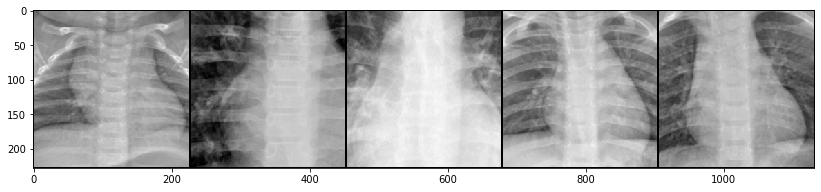

In [8]:
images, labels = dataiter.next()
print(images.shape)
print(torchvision.utils.make_grid(images).shape)
# show images
imshow(torchvision.utils.make_grid(images,))

In [9]:
images.shape #B, C, H, W

torch.Size([5, 1, 224, 224])

# Model Definition

In [11]:
class ActNorm(nn.Module):

    def __init__(self, channels):
        super().__init__()
        self.s = nn.Parameter(torch.ones(1, channels,1,1))
        self.b = nn.Parameter(torch.zeros(1, channels, 1,1))
        #this is just a flag to know if s and b have been initialized
        self.data_init = 0

    def forward(self, x):
        # if it's the first time, initialize the b, s depending on x
        if not self.data_init:
            # here is the tricky part 
            # paper says 
            # These parameters are initialized such that the post-actnorm activations per-channel have zero mean 
            # and unit variance given an initial minibatch of data
            # I'm guessing that means substracting the mean and dividing by the standard deviation
            # so I'm setting b to -(per_channel mean) and s to (1/(per_channel std))
            
            #x is going to be in B,C,H,W format
            #getting per channel mean and standard deviation
            per_channel = x.transpose(0,1).flatten(1)
            channels = per_channel.shape[0]
            means = -per_channel.mean(1) #substracting the mean
            stds = 1/(per_channel.std(1)+1e-6) #dividing over the standard deviation, 
                                               #just making sure not to divide by zero 
            
            #means and stds have shapes [channels]
            #have to be in (1,channels, 1, 1) shape to copy to b and s
            means = means.view(1, channels, 1, 1)
            stds = stds.view(1, channels, 1, 1)
            
            #copying to b and s
            self.b.data.copy_(means)
            self.s.data.copy_(stds)
            self.data_init = 1

        y = x * self.s + self.b
        log_det = x.shape[2] * x.shape[3] * torch.log(self.s.abs()).sum() 
        return y, log_det

    def backward(self, y):
        x = (y - self.b) / self.s
        log_det = - y.shape[2] * y.shape[3] * torch.log(self.s.abs()).sum()
        return x, log_det

In [12]:
class CouplingFunction(nn.Module):
    """ The coupling functions used in GLOW
        A 3-layer CNN as mentioned in the paper
        Hidden layers have 512 filters
        Used for both s and t
        channels is iqual to the half the channels at current scale
        set scale = False for translation t
    """

    def __init__(self, channels):
        super(CouplingFunction,self).__init__()
        self.channels = channels
        self.conv_layer1 = nn.Conv2d(channels//2, 512, kernel_size=3, padding=1)
        self.conv_layer2 = nn.Conv2d(512, 512, kernel_size=1, padding=1)
        self.conv_layer3 = nn.Conv2d(512, channels, kernel_size=3)
        
        self.scale_factor = nn.Parameter(torch.zeros(channels,1,1))
        
        #Use of actnorm taken directly from openAI tf implementation
        self.actn1 = ActNorm(512)
        self.actn2 = ActNorm(512)
        
        #last convolution is initialized to zeros
        self.conv_layer3.weight.data.zero_()
        self.conv_layer3.bias.data.zero_()
        
    def forward(self, x):
        z = self.conv_layer3(torch.relu(self.actn2(self.conv_layer2(torch.relu(self.actn1(self.conv_layer1(x))[0])))[0]))
        z = z * torch.exp(self.scale_factor)
        
        #use half the channels for s and half for t
        s = z[:,:self.channels//2,:,:]
        t = z[:,self.channels//2:,:,:]
        
        #Use of sigmoid taken from openAI tf implementation, RealNVP mentions using tanh
        return torch.sigmoid(s + 2.), t #adding 2 to get identity on first time

In [13]:
class AffineCouplingLayer(nn.Module):
    """
    Affine coupling layer from GLOW paper
    y1 = s * x1 + t
    y2 = x2
    Coupling functions are 3-layer CNN networks
    """
    
    def __init__(self, channels):
        super(AffineCouplingLayer, self).__init__()
        self.coupling = CouplingFunction(channels)
        
    def forward(self, x):
        #get 2 chunks over dimension 1, data is in B, C, H, W dimensions
        x1, x2 = x.chunk(2,1)
        s, t = self.coupling(x2)
        
        y1 = s * x1 + t
        y2 = x2
        log_det = torch.log(s).sum([1,2,3])
        return torch.cat((y1, y2), dim=1), log_det
    
    def backward(self, y):
        y1, y2 = y.chunk(2,1)
        s, t = self.coupling(y2)
        x1 = (y1 - t) / s
        x2 = y2
        log_det = - torch.log(s).sum([1,2,3])
        return torch.cat((x1, x2), dim=1), log_det

In [14]:
class AdditiveCouplingLayer(nn.Module):
    """
    Affine coupling layer from NICE paper
    y1 = x1 + t
    y2 = x2
    Coupling functions are 3-layer CNN networks
    """
    
    def __init__(self, channels):
        super(AffineCouplingLayer, self).__init__()
        self.coupling = CouplingFunction(channels)
        
    def forward(self, x):
        #get 2 chunks over dimension 1, data is in B, C, H, W dimensions
        x1, x2 = x.chunk(2,1)
        s, t = self.coupling(x2)
        
        y1 = x1 + t
        y2 = x2
        log_det = torch.zeros(x.shape[0])
        return torch.cat((y1, y2), dim=1), log_det
    
    def backward(self, y):
        y1, y2 = y.chunk(2,1)
        s, t = self.coupling(y2)
        x1 = y1 - t
        x2 = y2
        log_det = torch.zeros(y.shape[0])
        return torch.cat((x1, x2), dim=1), log_det

In [15]:
class InvertibleConvolution(nn.Module):
    #TODO LU decomposition version
    
    def __init__(self, channels):
        super(InvertibleConvolution, self).__init__()
        #The paper says that W is initialized to a random rotation matrix with logdet = 0
        #From Wikipedia:
        #   Rotation matrices are square matrices, with real entries.
        #   More specifically, they can be characterized as orthogonal matrices with determinant 1
        #   w = torch.qr(torch.randn(channels, channels))[0]
        w = torch.nn.init.orthogonal_(torch.randn(channels, channels))
        self.w = nn.Parameter(w)
        
    def forward(self, x):
        #y = x @ self.w
        y = F.conv2d(x, self.w.unsqueeze(-1).unsqueeze(-1))
        log_det = x.shape[2] * x.shape[3] * torch.slogdet(self.w)[1]
        return y, log_det
    
    def backward(self, y):
        #x = y @ self.w.inverse()
        w_inv = self.w.inverse()
        x = F.conv2d(y, w_inv.unsqueeze(-1).unsqueeze(-1))
        log_det = - y.shape[2] * y.shape[3] * torch.slogdet(self.w)[1]
        return x, log_det

In [16]:
class Squeeze(nn.Module):
    #Ok, had to go the openAI tf implementation for this
    #The squeezing operation transforms an s × s × c tensor into an 2/s × 2/s × 4c tensor
    def __init__(self):
        super().__init__()

    def forward(self, x):
        _,C,H,W = x.shape
        x = x.reshape(-1, C, H//2, 2, W//2, 2)   
        x = x.permute(0, 1, 3, 5, 2, 4)         
        x = x.reshape(-1, 4*C, H//2, W//2)       
        return x

    def backward(self, x):
        _,C,H,W = x.shape
        x = x.reshape(-1, C//4, 2, 2, H, W)      
        x = x.permute(0, 1, 4, 2, 5, 3)         
        x = x.reshape(-1, C//4, 2*H, 2*W)       
        return x

In [17]:
class Split(nn.Module):
    #RealNVP again
    #paper says
    #Propagating a D dimensional vector through all the coupling layers would be cumbersome, in terms
    #of computational and memory cost, and in terms of the number of parameters that would need to be
    #trained. For this reason we follow the design choice of [57] and factor out half of the dimensions at
    #regular intervals (see Equation 14). We can define this operation recursively (see Figure 4(b)),
    #At each layer, as the spatial resolution is reduced, the number of hidden layer features in s and t is doubled.
    #All variables which have been factored out at different scales are concatenated to obtain the final
    #transformed output (Equation 16).

    #Factoring out variables. At each step, half the variables are directly modeled as
    #Gaussians, while the otherhalf undergo further transformation.
    def __init__(self, n_channels):
        super().__init__()
        
        #Layers to learn the parameters through convolutions
        self.mean = nn.Conv2d(n_channels//2, n_channels//2, kernel_size=3, padding=1)
        self.log_std = nn.Conv2d(n_channels//2, n_channels//2, kernel_size=3, padding=1)
        
        #initializing to zero
        self.mean.weight.data.zero_()
        self.mean.bias.data.zero_()
        
        self.log_std.weight.data.zero_()
        self.log_std.bias.data.zero_()

    def forward(self, x):
        #samplig from a gaussian with known standard deviation and mean
        # If x is a sample from a mean 0 and variance 1 distribution then
        # std * x + mean
        x1, x2 = x.chunk(2, dim=1)  # split along channel dimensions
        mu = self.mean(x1)  # learn mu and log_std from x1
        l_std = self.log_std(x1)          
        z2 = (x2 - mu) * torch.exp(-l_std)  #modeling as gaussians
        logdet = -l_std.sum([1,2,3])
        return x1, z2, logdet

    
    def backward(self, x1, z2):
        mu = self.mean(x1)  
        l_std = self.log_std(x1)
        x2 = z2 * torch.exp(l_std) - mu
        logdet = - l_std.sum([1,2,3])  
        return torch.cat([x1, x2], dim=1), logdet

In [18]:
class GLOWStep(nn.Module):
    """ ActNorm -> Invertible 1x1 conv -> Coupling """
    def __init__(self, channels, additive = False):
        super().__init__()
        self.actnorm = ActNorm(channels)
        self.invertible_conv = InvertibleConvolution(channels)
        self.affine = AffineCouplingLayer(channels)
        if additive:
            self.affine = AdditiveCouplingLayer(channels)

    def forward(self, x):
        total_logdet = 0.
        #Actnorm
        y, logdet = self.actnorm(x)
        total_logdet = total_logdet + logdet
        
        #Invertible convolution
        y, logdet = self.invertible_conv(y)
        #print(logdet.shape)
        total_logdet = total_logdet + logdet
        
        #Affine coupling
        y, logdet = self.affine(y)
        #print(logdet.shape)
        total_logdet = logdet + total_logdet
        
        return y, total_logdet

    def backward(self, y):
        total_logdet = 0.
        #affine backward
        x, logdet = self.affine.backward(y)
        total_logdet = total_logdet + logdet
        
        #Invertible conv backward
        x, logdet = self.invertible_conv.backward(x)
        total_logdet = total_logdet + logdet
        
        #Actnorm backward
        x, logdet = self.actnorm.backward(x)
        total_logdet = total_logdet + logdet
        
        return x, total_logdet

In [19]:
class GLOWLevel(nn.Module):
    """ Squeeze -> GLOWStep x K -> Split """
    def __init__(self, n_channels, depth=32, additive = False):
        super().__init__()
        
        # Squeeze will create 4c channels
        lst = [GLOWStep(4*n_channels, additive) for _ in range(depth)]
        self.squeeze = Squeeze()
        self.steps = nn.ModuleList(lst)
        self.split = Split(4*n_channels)

    def forward(self, x):
        #Squeezing, no log det
        x = self.squeeze(x)
        total_logdet = 0.
        
        #Going through the steps 
        for step in self.steps:
            x, logdet = step(x)
            total_logdet = total_logdet + logdet
            
        #Split    
        x1, z2, logdet_split = self.split(x)
        
        total_logdet = total_logdet + logdet_split
        return x1, z2, total_logdet

    def backward(self, x1, z2):
        x, total_logdet = self.split.backward(x1, z2)
        for step in reversed(self.steps):
            x, logdet = step.backward(x)
            total_logdet = total_logdet + logdet
        x = self.squeeze.backward(x)
        return x, total_logdet

In [20]:
class GLOW(nn.Module):
    def __init__(self, channels, depth, n_levels, additive = False):
        super().__init__()
        lst_lvl = [GLOWLevel(channels * 2**i, depth, additive) for i in range(n_levels-1)]
        self.levels = nn.ModuleList(lst_lvl)
        self.squeeze = Squeeze()
        last_n_channels = channels * 2**(n_levels-1)
        
        #after the last squeeze
        last_n_channels *= 4
        
        #The last steps without a split
        lst_step = [GLOWStep(last_n_channels, additive) for _ in range(depth)]
        self.steps = nn.ModuleList(lst_step)
        
        
        #to model as a gaussian the last z
        self.mean = nn.Conv2d(last_n_channels, last_n_channels, kernel_size=3, padding=1)
        self.log_std = nn.Conv2d(last_n_channels, last_n_channels, kernel_size=3, padding=1)
        
        #initializing to zero
        self.mean.weight.data.zero_()
        self.mean.bias.data.zero_()     
        self.log_std.weight.data.zero_()
        self.log_std.bias.data.zero_()
        
    def forward(self, x):
        # list to store the different z's
        z_list = []
        total_logdet = 0.
        
        #Go throught the levels
        for level in self.levels:
            x, z, logdet = level(x)
            total_logdet += logdet
            z_list.append(z)
            
        #Last squeeze
        x = self.squeeze(x)
        
        #Last GLOWSteps without a split
        for step in self.steps:
            x, logdet = step(x)
            total_logdet += logdet      
        
        #modeling as gaussians the last z variables
        mock_values = torch.zeros_like(x)
        mu = self.mean(mock_values)  # there's no x1 so use zeros, or ones?
        l_std = self.log_std(mock_values)     
        
        z = (x - mu) * torch.exp(-l_std)
        logdet = - l_std.sum()
        
        z_list.append(z)
        
        total_logdet = total_logdet + logdet
        
        return z_list, total_logdet
    
    def backward(self, z_list):
        # everything but in reverse order
        #sampling z from prior
        #z = temp * prior.sample((n, channels, hw, hw)).squeeze() #when sampling a 1-dim is always created at the end
        
        z = z_list[-1]
        
        #gaussian stuff
        mock_values = torch.zeros_like(z)
        mu = self.mean(mock_values)  
        l_std = self.log_std(mock_values)
        
        total_logdet = 0.
        
        x = z * torch.exp(l_std) + mu #modeling as gaussians
        logdet = l_std.sum()
        
        total_logdet = total_logdet + logdet
        
        #last steps
        for step in reversed(self.steps):
            x, logdet = step.backward(x)
            total_logdet = logdet + total_logdet
            
        #last squeeze
        x = self.squeeze.backward(x)
        
        #going through levels in revers
        for i, level in enumerate(reversed(self.levels)):
            #sampling new z's from prior
            #z = temp * prior.sample(x.shape).squeeze()
            z = z_list[-(2+i)]
            x, logdet = level.backward(x, z)
            total_logdet = total_logdet + logdet
            
        return x, total_logdet

In [21]:
def sample(prior, n_samples, n_levels, initial_channels, initial_hw, std = 1.0):
    samples = []
    n_levels -= 1 #using the highest index value
    initial_channels *= 2
    initial_hw = initial_hw // 2
    for i in range(n_levels):
        z = std * prior.sample((n_samples, initial_channels * 2**i, initial_hw // 2**i, initial_hw // 2**i)).squeeze()
        samples.append(z)
    #last z
    z = std * prior.sample((n_samples, (initial_channels * 2**n_levels)*2, initial_hw // 2**n_levels, initial_hw // 2**n_levels)).squeeze()
    samples.append(z)
    return samples

In [22]:
def create_images(model, prior, n_samples, z_stds, n_levels, c, hw):
    model.eval()
    samples = []
    for z_std in z_stds:
        with torch.no_grad():
            h = sample(prior, n_samples, n_levels, initial_channels=c, initial_hw=hw, std=z_std)
            s, _ = model.backward(h)
            zs, log_det = model(s)
            prior_logprob = sum(prior.log_prob(z).sum([1,2,3]) for z in zs)
            log_prob = prior_logprob + log_det
            log_prob /= (math.log(2) * c * hw * hw)
            samples.append(s[log_prob.argsort().flip(0)])  # order from high to low
    return torch.cat(samples,0)

# Creating the model

In [23]:
glow_xray = GLOW(channels = 1, depth=24, n_levels=5).to(device)
xrays, _ = xray_dataiter.next()

In [24]:
optimizer = optim.Adam(glow_xray.parameters(), lr=1e-4)

In [25]:
gaussian = Normal(torch.zeros(1).to(device), torch.ones(1).to(device))

In [26]:
c = 1
n_levels = 5
hw = 224
glow_model = glow_xray
trainloader = xray_trainloader
stds = [0.,0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9]
n_samples = 10

In [80]:
#optimizer.load_state_dict(torch.load("optimizer_glow.pt"))

In [29]:
with torch.no_grad():
    zs, logdet = glow_model(celebs.to(device))
    x, _ = glow_model.backward(zs)
len(zs)

4

In [30]:
#glow_celeb.load_state_dict(torch.load("glow_celeb_4l_24d.pt"), strict=True)

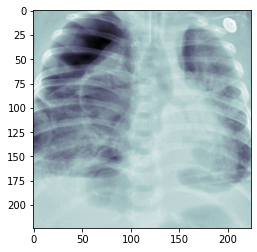

In [27]:
plt.imshow(images[2].permute(1,2,0).squeeze().detach(), cmap=plt.cm.bone)

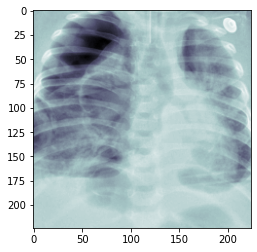

In [28]:
plt.imshow(x[2].permute(1,2,0).squeeze().detach().cpu(), cmap=plt.cm.bone)

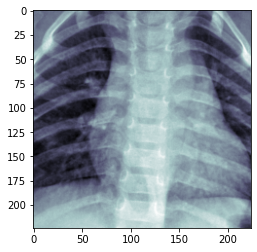

In [83]:
plt.imshow(images[2].permute(1,2,0).squeeze().detach().cpu(), cmap=plt.cm.bone)

Epoch: 0
batch: 99 loss: -6.259461879730225
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


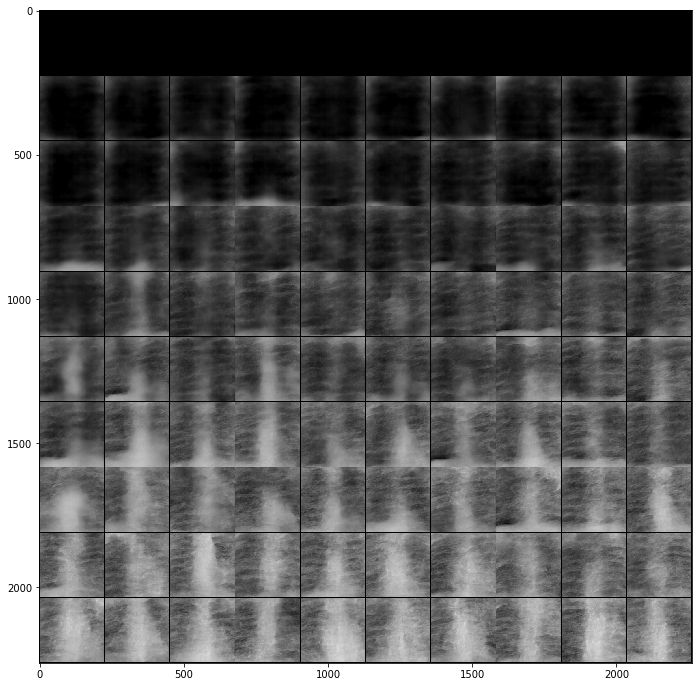

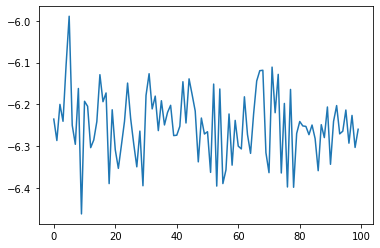

batch: 199 loss: -6.129108905792236
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


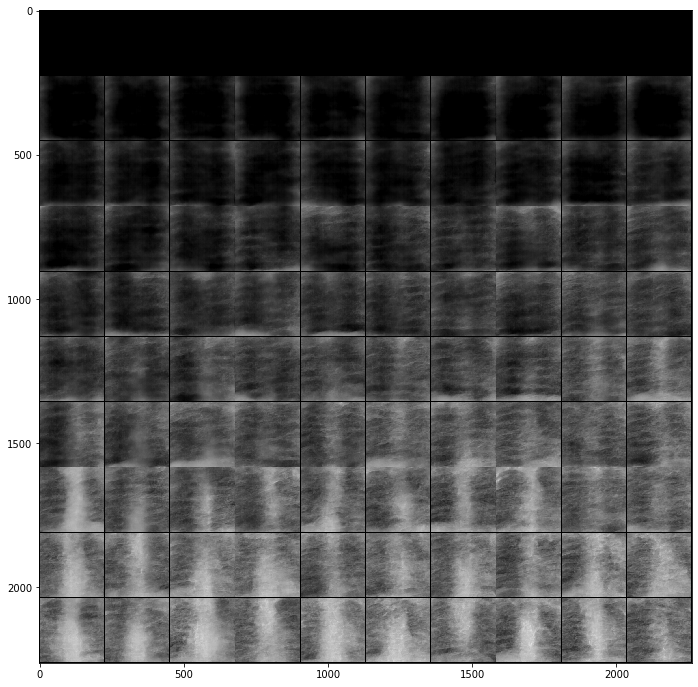

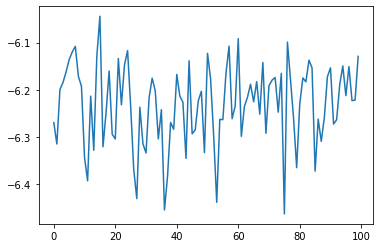

batch: 299 loss: -6.3599853515625
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


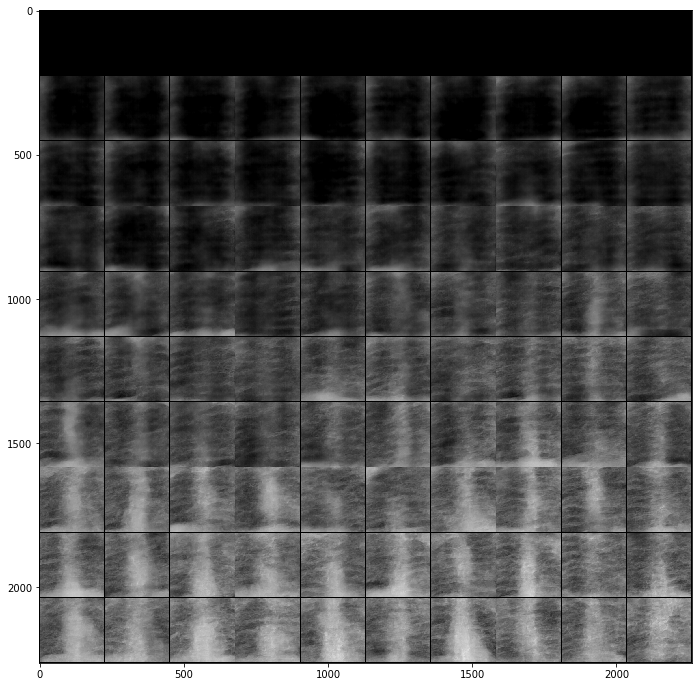

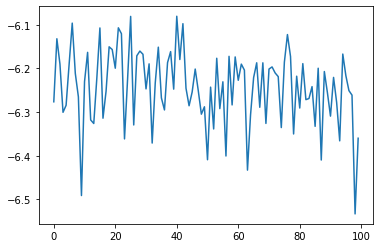

Epoch: 1
batch: 99 loss: -6.235943794250488
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


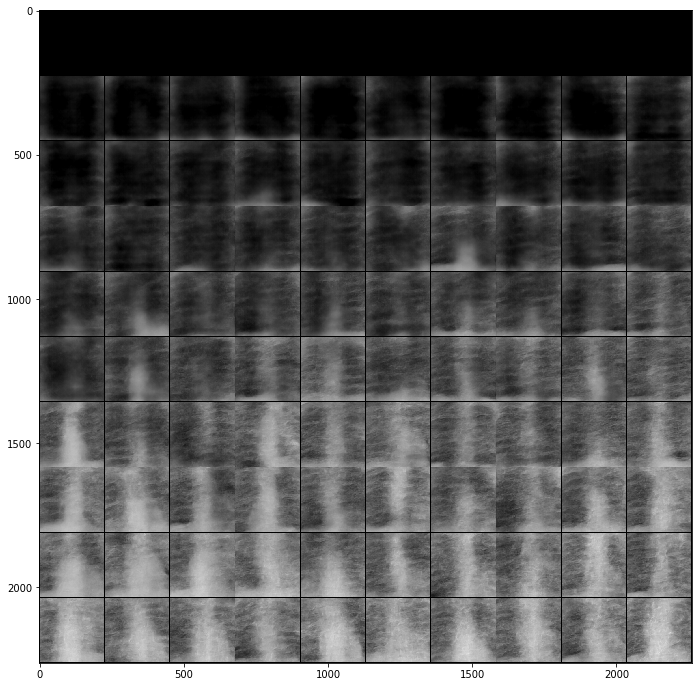

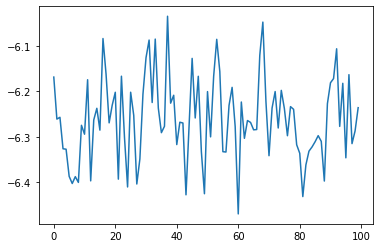

batch: 199 loss: -6.240769863128662
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


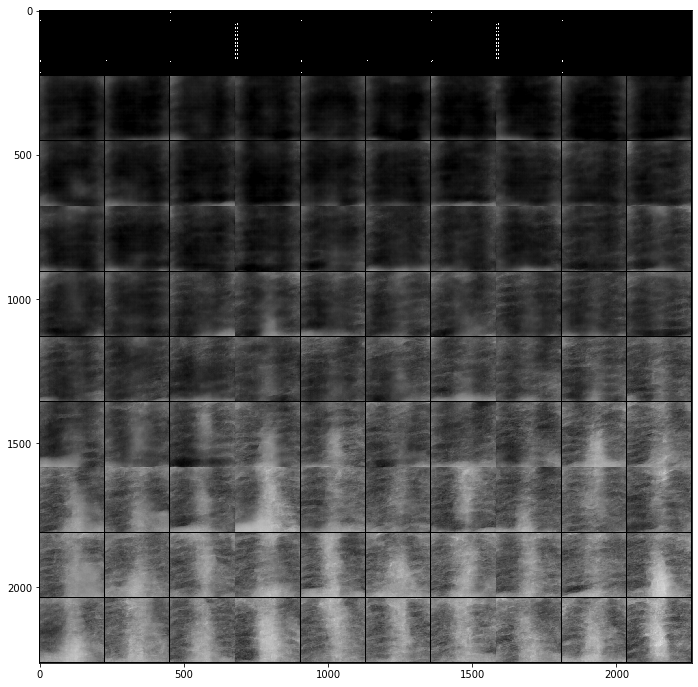

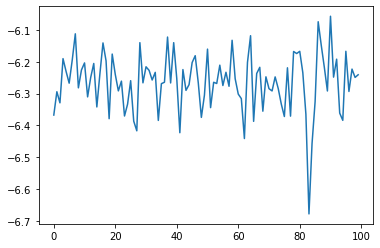

batch: 299 loss: -6.20051908493042
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


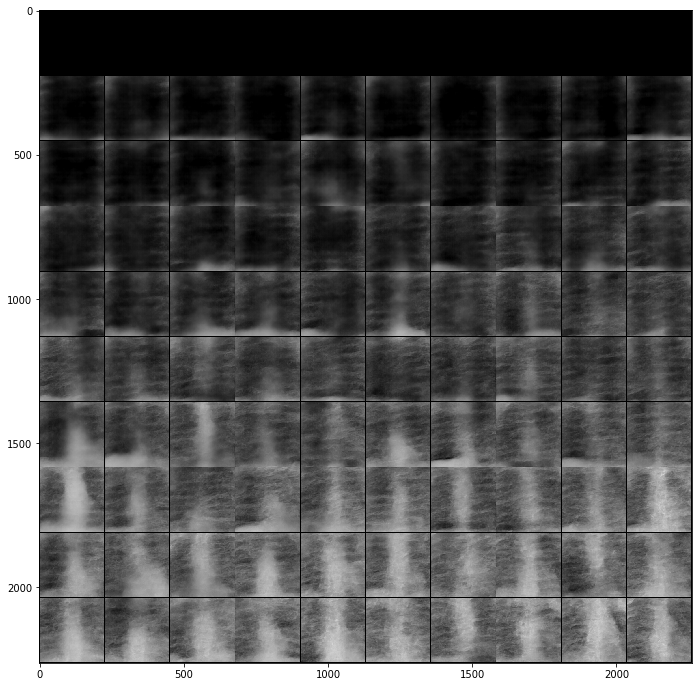

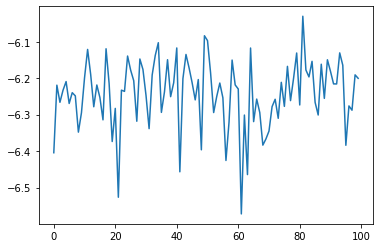

Epoch: 2
batch: 99 loss: -6.32231330871582
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


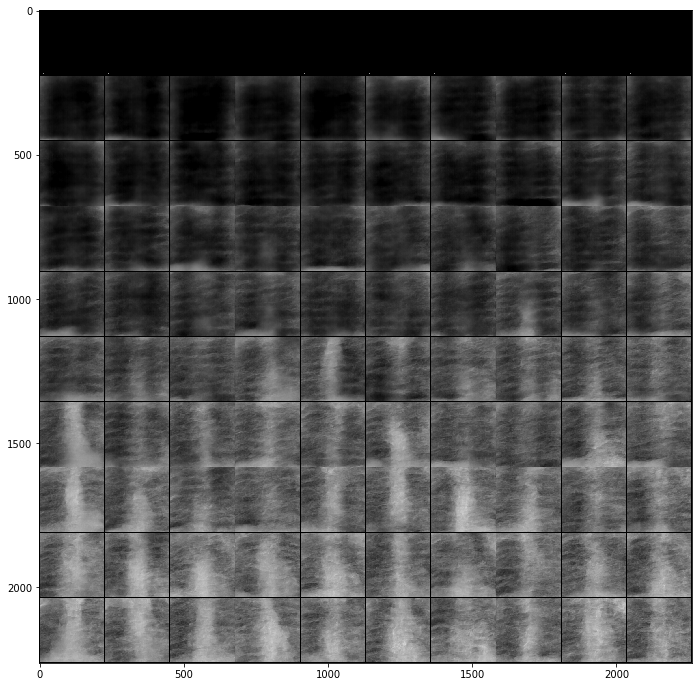

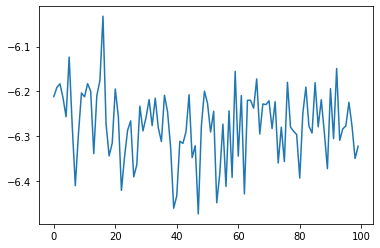

batch: 199 loss: -6.235306739807129
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


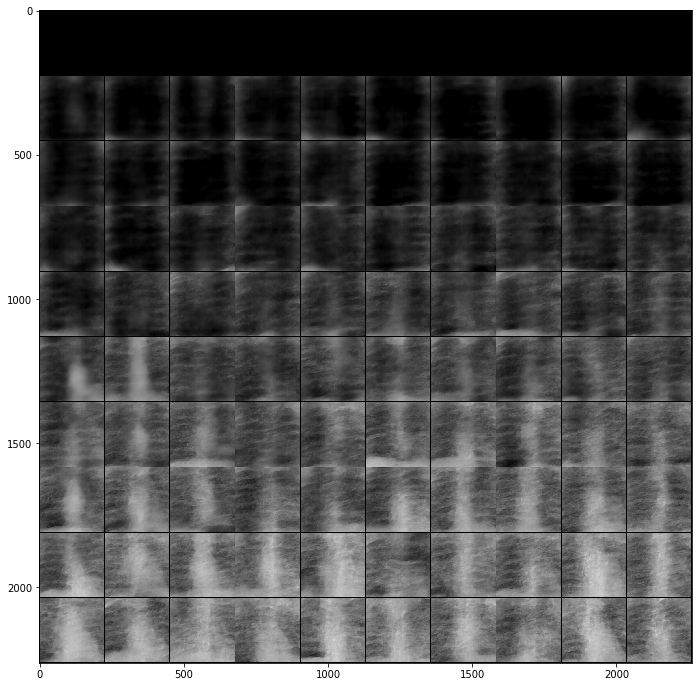

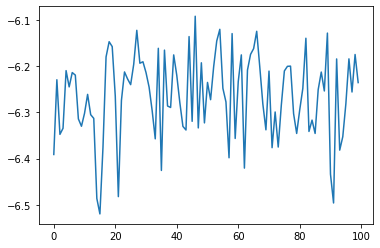

batch: 299 loss: -6.295144557952881
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


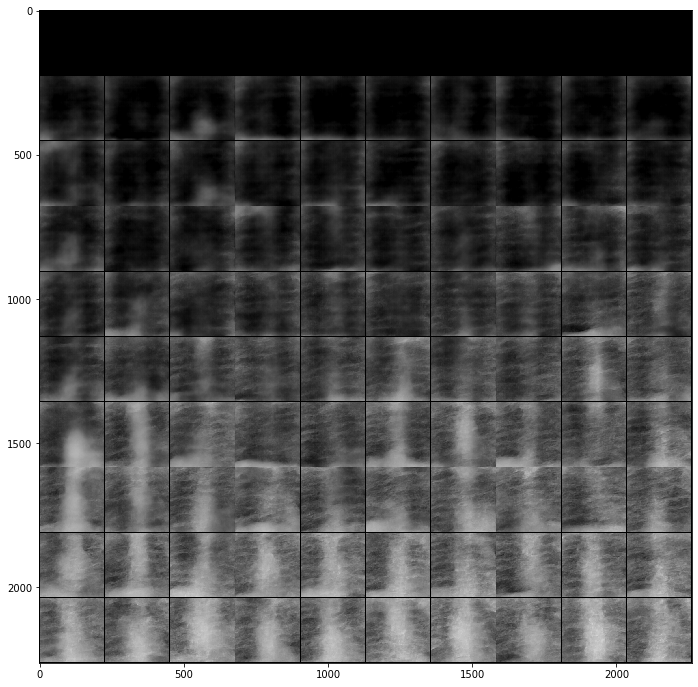

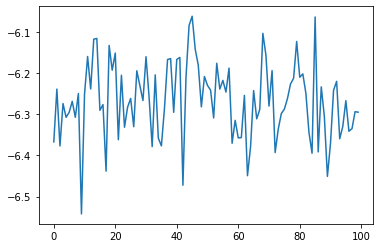

Epoch: 3
batch: 99 loss: -6.4032816886901855
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


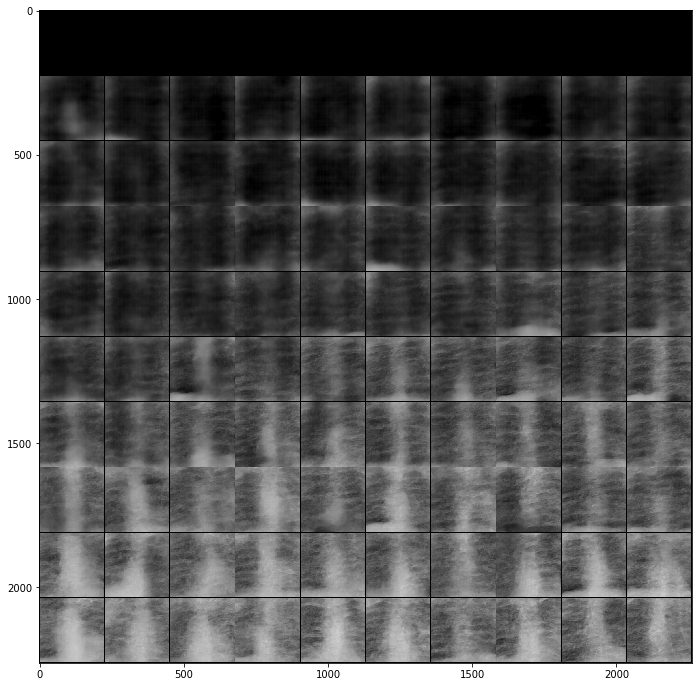

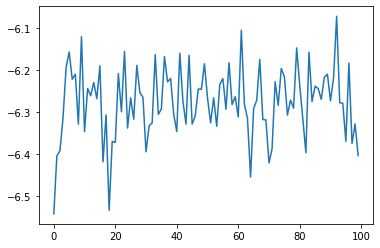

batch: 199 loss: -6.33432674407959
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


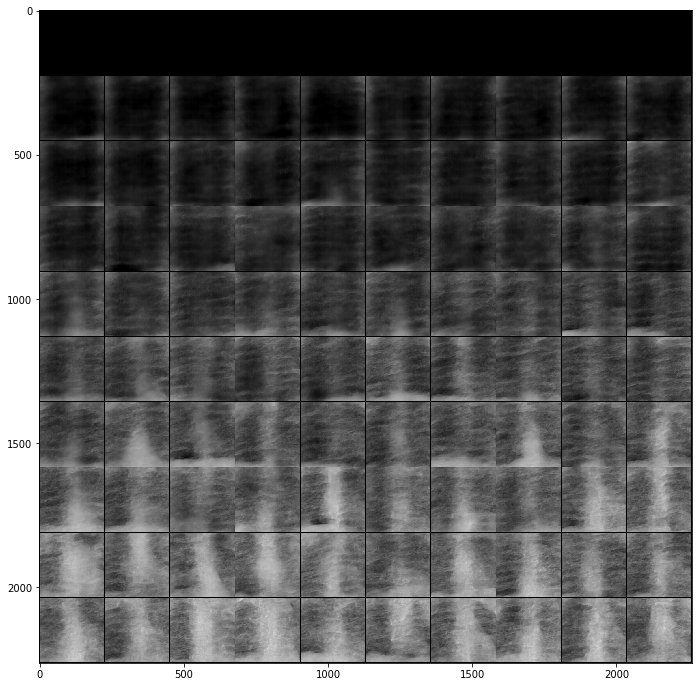

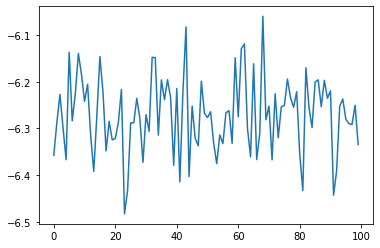

batch: 299 loss: -6.388166904449463
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


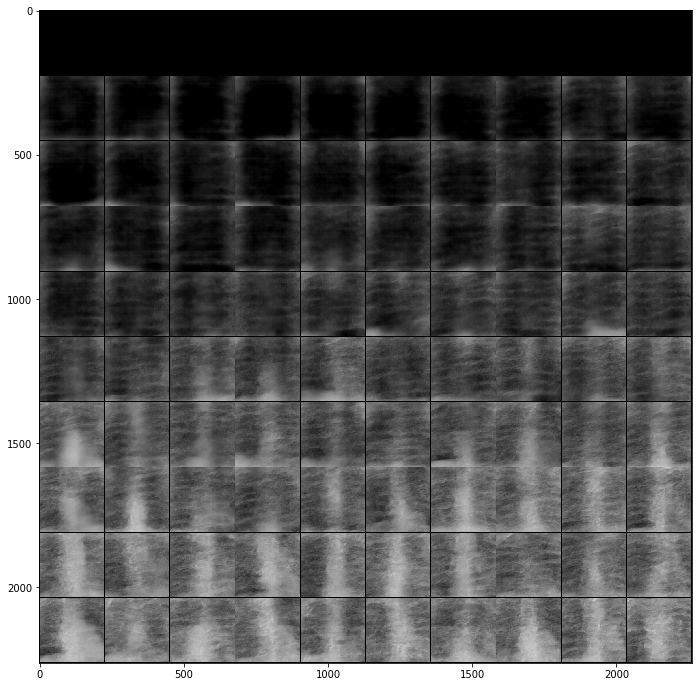

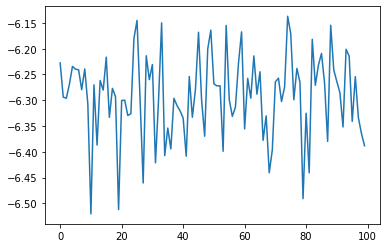

Epoch: 4
batch: 99 loss: -6.298299312591553
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


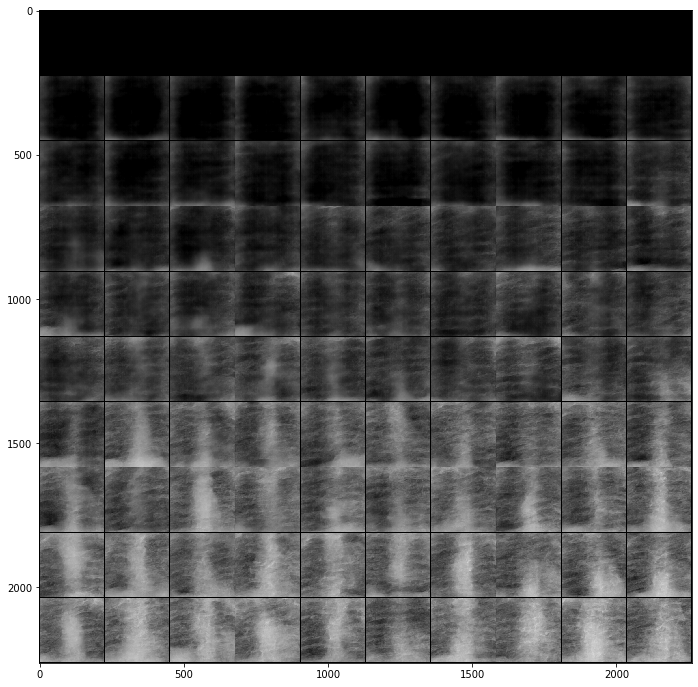

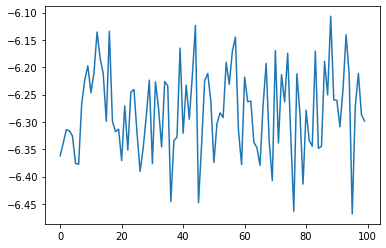

batch: 199 loss: -6.308710098266602
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


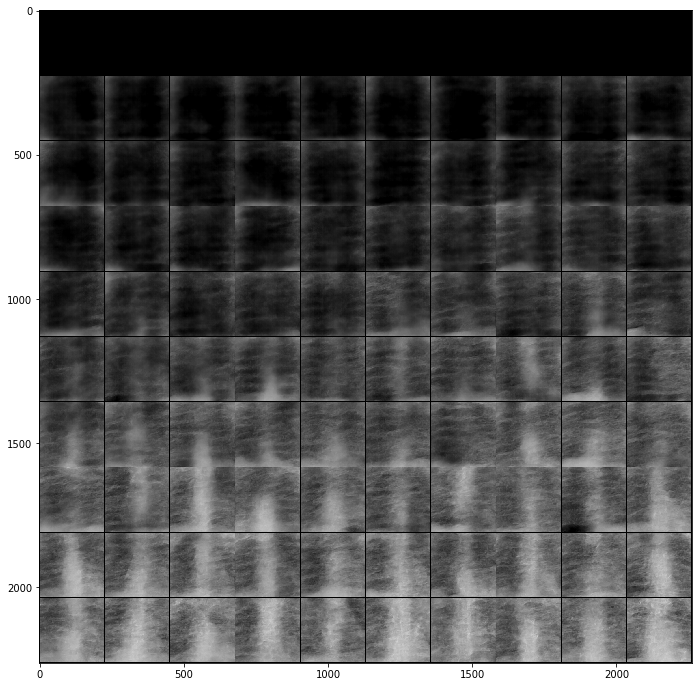

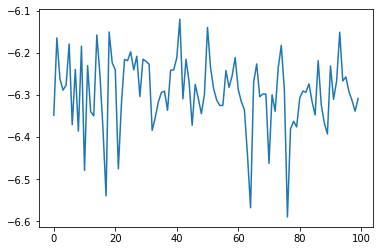

batch: 299 loss: -6.350631237030029
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


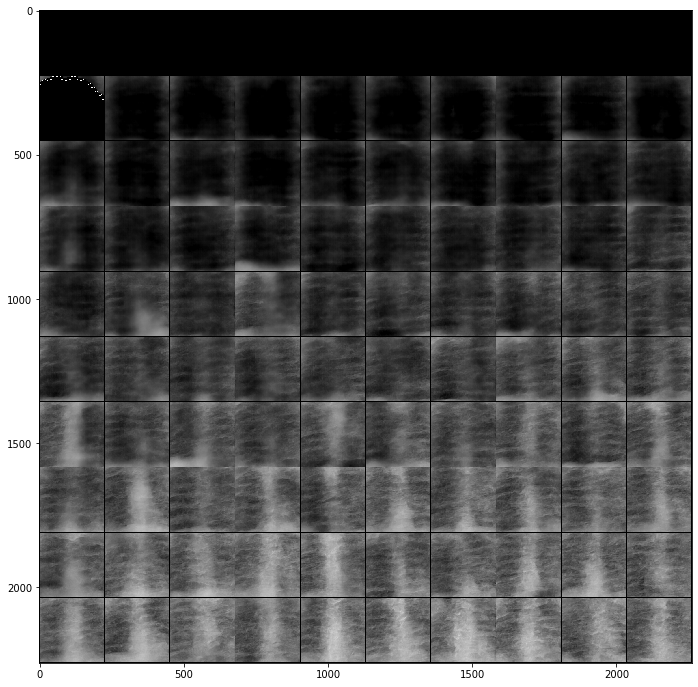

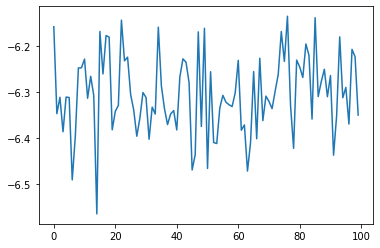

Epoch: 5


In [ ]:
prior = gaussian
glow_model.train()
losses = []
eval_every = 100
for epoch in range(10):
    print("Epoch:",epoch)
    dataiter = iter(xray_trainloader)
    for batch in range(len(dataiter)):
    #for batch in range(10):
        #print("batch:",batch)
        images, _ = dataiter.next()
        #images = images / torch.tensor(2.) + torch.tensor(0.5)
        
        zs, log_det = glow_model(images.to(device))
        
        prior_logprob = sum(prior.log_prob(z).sum([1,2,3]) for z in zs)
        log_prob = prior_logprob + log_det
        
        #bits per pixel
        #Compute the negative log likelihood in base e, apply change of base for converting log base e
        #to log base 2, then divide by the number of pixels (e.g. 3072 pixels for a 32x32 rgb image).
        #https://stats.stackexchange.com/questions/423120/what-is-bits-per-dimension-bits-dim-exactly-in-pixel-cnn-papers
        log_prob /= (math.log(2) * c * hw * hw)
        loss = - log_prob.mean()
        
        #print(loss.item())
        losses.append(loss.item())
        
        if loss == float("inf"):
            print("Something went wrong")
            break

            
        optimizer.zero_grad()
        loss.backward()
        
        nn.utils.clip_grad_norm_(glow_model.parameters(), 50)
        
        optimizer.step()
        
        if (batch+1) % eval_every == 0:
            #losses.append(loss.item())
            glow_model.eval()
            print("batch:",batch,"loss:",loss.item())
            print("Sampling")
            xrays_generated = create_images(glow_model, prior, n_samples, stds, 5, 1, 224)
            imshow(torchvision.utils.make_grid(xrays_generated.cpu(), nrow=n_samples))
            plt.plot(losses[-eval_every:])
            plt.show()
            glow_model.train()
        
    #torch.save(glow_model.state_dict(), "glow_xray_5l_24d_1e.pt")

In [101]:
torch.save(glow_model.state_dict(), "glow_xray_normal_5l_24d_224d_100e.pt")

In [111]:
glow_xray.load_state_dict(torch.load("glow_xray_5l_24d_1c_50e.pt"), strict=True)

<All keys matched successfully>

In [112]:
xrays_generated = create_images(glow_xray, gaussian, n_samples, stds, 5, 1, 224)

In [123]:
xrays_generated.shape

torch.Size([100, 1, 224, 224])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


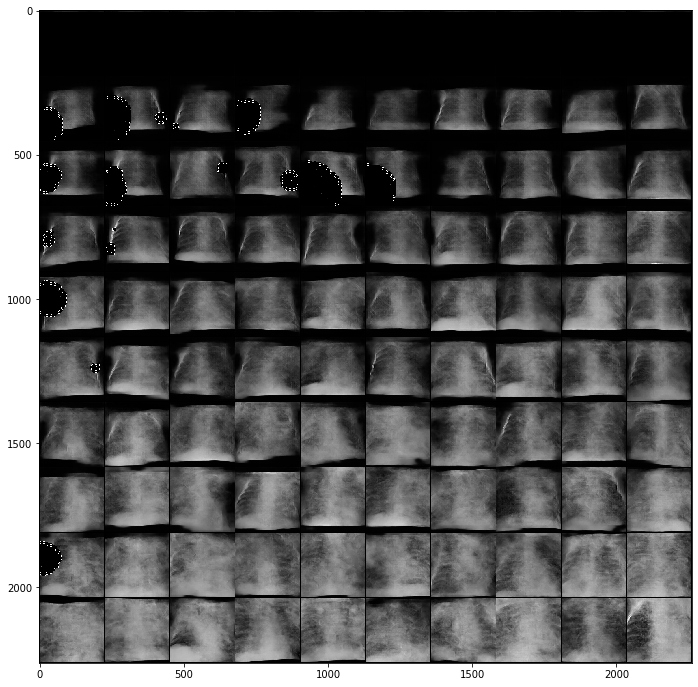

In [113]:
imshow(torchvision.utils.make_grid(xrays_generated.cpu(), nrow=n_samples))

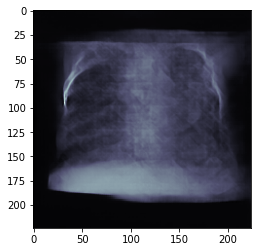

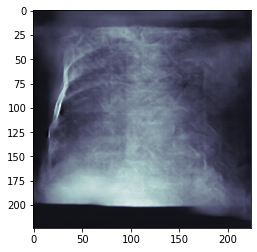

In [125]:
plt.imshow(xrays_generated[32].permute(1,2,0).squeeze().cpu(), cmap=plt.cm.bone)
plt.show()
plt.imshow(xrays_generated[55].permute(1,2,0).squeeze().cpu(), cmap=plt.cm.bone)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


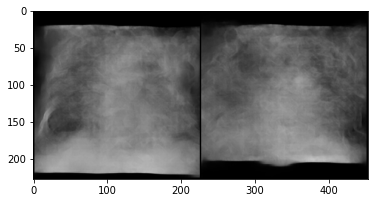

In [113]:
h = sample(gaussian, n_samples=2, n_levels=5, initial_channels=1, initial_hw=224, std=.75)
with torch.no_grad():
    xs, _ = glow_model.backward(h)
xs = xs.detach().cpu()#{.view(-1,3,64,64)
imshow(torchvision.utils.make_grid(xs))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


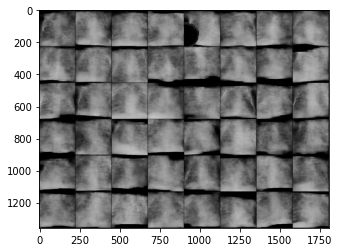

In [126]:
h = sample(gaussian, n_samples=48, n_levels=5, initial_channels=1, initial_hw=224, std=.85)
with torch.no_grad():
    xs, _ = glow_model.backward(h)
xs = xs.detach().cpu()#{.view(-1,3,64,64)
imshow(torchvision.utils.make_grid(xs))

In [71]:
test_stds = [0.8, 0.85, 0.9, 0.95]

In [72]:
test = create_images(glow_model, gaussian, 10, test_stds, 5, 1, 224)

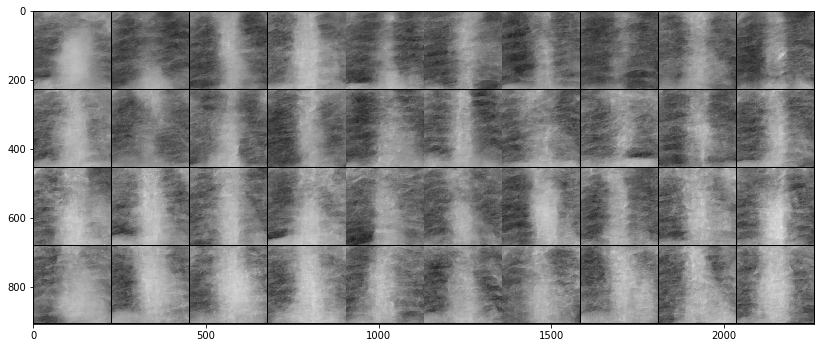

In [73]:
test = test.cpu()
imshow(torchvision.utils.make_grid(test, nrow=10))

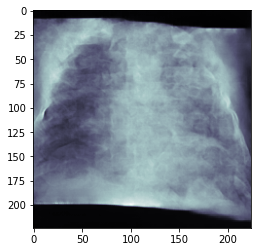

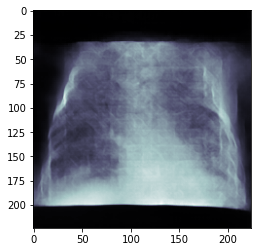

In [226]:
plt.imshow(test[33].permute(1,2,0).squeeze(), cmap=plt.cm.bone)
plt.show()
plt.imshow(test[6].permute(1,2,0).squeeze(), cmap=plt.cm.bone)


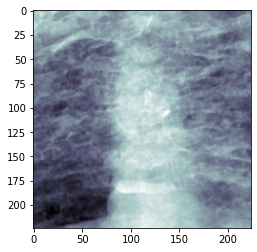

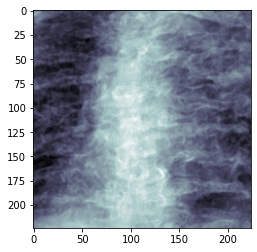

In [74]:
plt.imshow(test[24].permute(1,2,0).squeeze(), cmap=plt.cm.bone)
plt.show()
plt.imshow(test[34].permute(1,2,0).squeeze(), cmap=plt.cm.bone)

# Initializing the classifier

In [44]:
alexnet_classifier = models.alexnet(pretrained=False)
num_ftrs = alexnet_classifier.classifier[6].in_features
alexnet_classifier.classifier[6] = nn.Linear(num_ftrs,2)
xray_classes = ["Normal", "Pneumonia"]
alexnet_classifier.load_state_dict(torch.load("alexnet_xray_classifier.pt"), strict=True)

<All keys matched successfully>

In [45]:
vgg_classifier = models.vgg19(pretrained=False)
num_ftrs = vgg_classifier.classifier[6].in_features
vgg_classifier.classifier[6] = nn.Linear(num_ftrs,2)
vgg_classifier.load_state_dict(torch.load("vgg_xray_classifier.pt"), strict=True)

<All keys matched successfully>

In [46]:
resnet_classifier = models.resnet50(pretrained=False)
num_ftrs = resnet_classifier.fc.in_features
resnet_classifier.fc = nn.Linear(num_ftrs, 2)
resnet_classifier.load_state_dict(torch.load("resnet_xray_classifier.pt"), strict=True)

<All keys matched successfully>

In [76]:
test_3c = test.expand(len(test), 3, -1, -1)

In [233]:
images_3c = images.expand(5,3,-1,-1)

In [77]:
with torch.no_grad():
    output_alex = alexnet_classifier(test_3c)
    output_vgg = vgg_classifier(test_3c)
    output_resnet = resnet_classifier(test_3c)

In [219]:
with torch.no_grad():
    output_alex = alexnet_classifier(images_3c)
    output_vgg = vgg_classifier(images_3c)
    output_resnet = resnet_classifier(images_3c)

In [78]:
_, predictions_alex = torch.max(output_alex, 1)
_, predictions_vgg = torch.max(output_vgg, 1)
_, predictions_resnet = torch.max(output_resnet, 1)

In [81]:
fooling_acc_alex = predictions_alex.sum().item() / len(predictions_alex)
print("Fooling accuracy Alexnet: ", fooling_acc_alex)
fooling_acc_vgg = predictions_vgg.sum().item() / len(predictions_vgg)
print("Fooling accuracy Vgg: ", fooling_acc_vgg)
fooling_acc_resnet = predictions_resnet.sum().item() / len(predictions_resnet)
print("Fooling accuracy Resnet: ", fooling_acc_resnet)

Fooling accuracy Alexnet:  0.35
Fooling accuracy Vgg:  0.675
Fooling accuracy Resnet:  0.575


In [79]:
fooling_acc_alex = (len(predictions_alex) - predictions_alex.sum().item()) / len(predictions_alex)
print("Fooling accuracy Alexnet: ", fooling_acc_alex)
fooling_acc_vgg = (len(predictions_vgg) - predictions_vgg.sum().item()) / len(predictions_vgg)
print("Fooling accuracy Vgg: ", fooling_acc_vgg)
fooling_acc_resnet = (len(predictions_resnet) - predictions_resnet.sum().item()) / len(predictions_resnet)
print("Fooling accuracy Resnet: ", fooling_acc_resnet)

Fooling accuracy Alexnet:  0.65
Fooling accuracy Vgg:  0.325
Fooling accuracy Resnet:  0.425


In [80]:
print('\n'.join('%5s' % xray_classes[predictions_resnet[j]] for j in range(len(predictions_resnet))))

Normal
Pneumonia
Pneumonia
Normal
Pneumonia
Pneumonia
Pneumonia
Pneumonia
Pneumonia
Pneumonia
Normal
Pneumonia
Pneumonia
Pneumonia
Pneumonia
Pneumonia
Normal
Pneumonia
Pneumonia
Normal
Normal
Normal
Normal
Normal
Pneumonia
Pneumonia
Normal
Pneumonia
Normal
Normal
Pneumonia
Normal
Normal
Normal
Normal
Pneumonia
Pneumonia
Pneumonia
Pneumonia
Normal


In [70]:
print('\n'.join('%5s' % xray_classes[predictions_resnet[j]] for j in range(len(predictions_resnet))))

Normal
Pneumonia
Pneumonia
Pneumonia
Pneumonia
Pneumonia
Pneumonia
Pneumonia
Pneumonia
Pneumonia
Pneumonia
Pneumonia
Pneumonia
Pneumonia
Pneumonia
Pneumonia
Pneumonia
Pneumonia
Pneumonia
Normal
Normal
Pneumonia
Pneumonia
Pneumonia
Pneumonia
Pneumonia
Pneumonia
Pneumonia
Pneumonia
Normal
Pneumonia
Pneumonia
Pneumonia
Normal
Pneumonia
Pneumonia
Pneumonia
Pneumonia
Normal
Normal
Pneumonia
Pneumonia
Normal
Normal
Pneumonia
Normal
Normal
Pneumonia
Normal
Normal
Normal
Normal
Pneumonia
Pneumonia
Normal
Normal
Normal
Normal
Normal
Normal


# CIFAR-10

In [56]:
#Loading a pretrained glow model
glow_cifar = GLOW(channels = 3, depth=32, n_levels=3).to(device)

with torch.no_grad():
    zs, logdet = glow_cifar(images.to(device))
    x, _ = glow_cifar.backward(zs)

glow_cifar.load_state_dict(torch.load("glow_cifar_3l_32d.pt"), strict=True)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


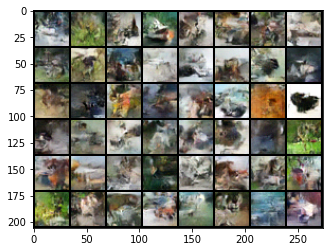

In [45]:
h = sample(gaussian, n_samples=48, n_levels=3, initial_channels=3, initial_hw=32, std=.99)
with torch.no_grad():
    xs, _ = glow_cifar.backward(h)
xs = xs.detach().cpu().view(-1,3,32,32)
imshow(torchvision.utils.make_grid(xs))

In [31]:
#glow_model.load_state_dict(torch.load("glow_cifar_3l_32d.pt"), strict=True)

# CelebA

In [ ]:
#Loading a pretrained glow model
glow_celeb = GLOW(channels = 3, depth=24, n_levels=4).to(device)

with torch.no_grad():
    zs, logdet = glow_celeb(images.to(device))
    x, _ = glow_celeb.backward(zs)

glow_celeb.load_state_dict(torch.load("glow_celeb_4l_24d_128d_1e.pt"), strict=True)

In [42]:
celebs_generated = create_images(glow_celeb, gaussian, n_samples, stds, 4, 3, 128)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


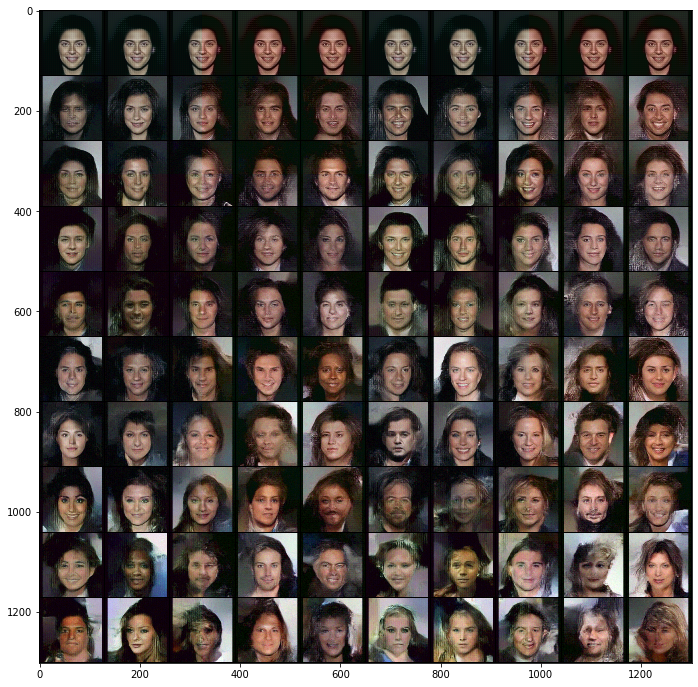

In [43]:
imshow(torchvision.utils.make_grid(celebs_generated.cpu(), nrow=n_samples))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


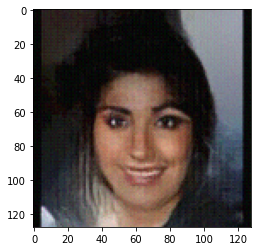

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


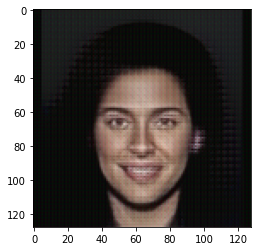

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


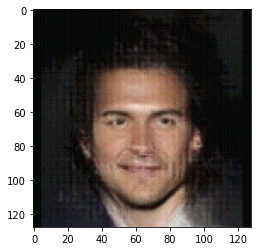

In [47]:
plt.imshow(celebs_generated[70].permute(1,2,0).squeeze().cpu())
plt.show()
plt.imshow(celebs_generated[9].permute(1,2,0).squeeze().cpu())
plt.show()
plt.imshow(celebs_generated[24].permute(1,2,0).squeeze().cpu())

In [30]:
celebs_generated = create_images(glow_celeb, gaussian, n_samples, stds, 4, 3, 64)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


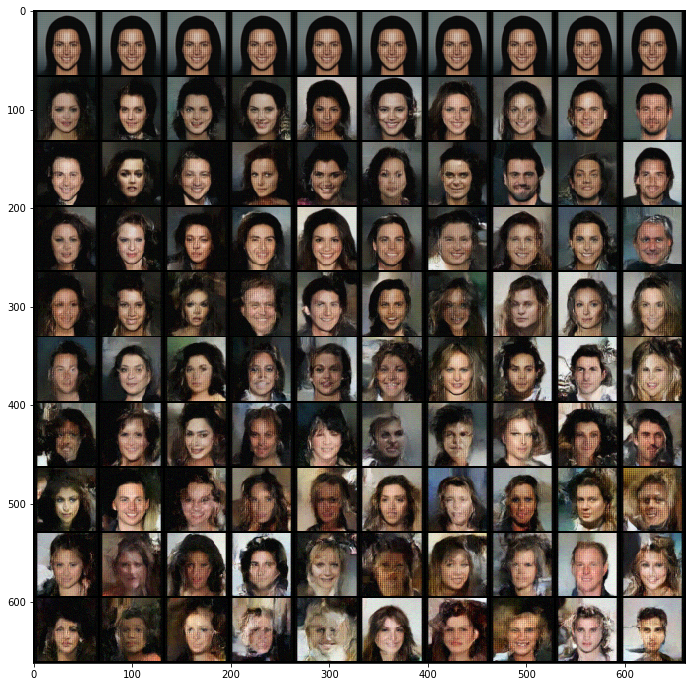

In [101]:
imshow(torchvision.utils.make_grid(celebs_generated.cpu(), nrow=n_samples))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


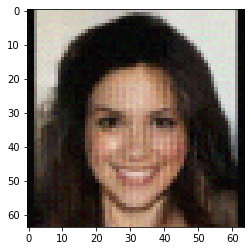

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


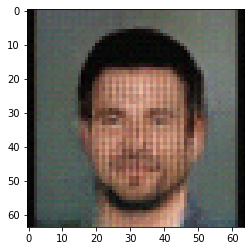

In [108]:
plt.imshow(celebs_generated[34].permute(1,2,0).squeeze().cpu())
plt.show()
plt.imshow(celebs_generated[19].permute(1,2,0).squeeze().cpu())

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


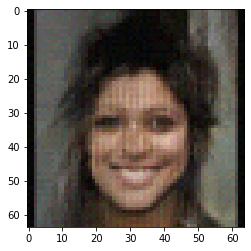

In [102]:
plt.imshow(xs[46].permute(1,2,0))
plt.show()

# Misc Code